**Enable GPU** (Runtime > Change runtime type > GPU)

In [42]:
!nvidia-smi

Wed Sep 14 17:52:15 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   77C    P0    35W /  70W |   2166MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Clone MddGAN repo

In [43]:
import os

os.chdir('/content')
CODE_DIR = 'mddgan'
!git clone https://github.com/lazavgeridis/mddgan.git $CODE_DIR
os.chdir(f'./{CODE_DIR}')

fatal: destination path 'mddgan' already exists and is not an empty directory.


In [44]:
!pip install tensorly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


GAN Model Selection (StyleGAN2 only)

In [45]:
#@title { display-mode: "form", run: "auto" }
gan_model_name = "stylegan2_ffhq1024" #@param ['stylegan2_ffhq1024', 'stylegan2_car512', 'stylegan2_cat256', 'stylegan2_church256', 'stylegan2_horse256']

Load selected GAN model

In [46]:
from models import parse_gan_type
from utils  import load_generator, analyze_latent_space

generator = load_generator(gan_model_name).cuda()
gan_type  = parse_gan_type(generator)

Building generator for model `stylegan2_ffhq1024` ...
Finish building generator.
Loading checkpoint from `checkpoints/stylegan2_ffhq1024.pth` ...
Finish loading checkpoint.


Utility Functions for Figure Creation

In [47]:
from visualization import interpolation_chart, draw_chart
from matplotlib import pyplot as plt
from PIL import Image
%matplotlib inline


def select_bases(basis_tensor, n_modes, mode_idx, n_rows, skip_first):
  '''
  Params:
  -------
  basis_tensor : np.ndarray
    the multilinear basis
  n_modes : int
    number of variation modes the data is assumed to be composed of
  mode_idx : int
    index indicating the dimension of the tensor to be sliced
  n_rows : int
    how many rows to show on the figure. Each row depicts a semantic
    editing operation
  skip_first : boolean
    whether to skip the first basis vector of the specified mode

  Returns:
  --------
  basis_vectors : np.ndarray
    basis_vectors to be used for semantic image editing and to 
    appear on the figure
  '''
  dim_val = basis_tensor.shape[1 + mode_idx]

  if (dim_val > n_rows) or (dim_val == n_rows and not skip_first):      # straight-forward
    start = 1 if skip_first else 0
    if mode_idx == 0:
      if n_modes == 2:
        basis_vectors = basis_tensor[:, start:, 0]
      elif n_modes == 3:
        basis_vectors = basis_tensor[:, start:, 0, 0]
    elif mode_idx == 1:
      if n_modes == 2:
        basis_vectors = basis_tensor[:, 0, start:]
      elif n_modes == 3:
        basis_vectors = basis_tensor[:, 0, start:, 0]
    elif mode_idx == 2:
      if n_modes == 3:
        basis_vectors = basis_tensor[:, 0, 0, start:]

  elif (dim_val < n_rows) or (dim_val == n_rows and skip_first): # need to concatenate - trickier case
    start = 1 if skip_first else 0
    rem = n_rows - dim_val + start

    if mode_idx == 0:
      if n_modes == 2:
        basis_vectors = np.concatenate((basis_tensor[:, start:dim_val, 0], basis_tensor[:, 0:min(rem, dim_val), 1]), axis=1)
        rem = n_rows - basis_vectors.shape[1]
        idx = 2
        while rem != 0:
          basis_vectors = np.concatenate((basis_vectors, basis_tensor[:, 0:min(rem, dim_val), idx]), axis=1)
          rem = n_rows - basis_vectors.shape[1]
          idx += 1
      elif n_modes == 3:
        basis_vectors = np.concatenate((basis_tensor[:, start:dim_val, 0, 0], basis_tensor[:, 0:min(rem, dim_val), 1, 1]), axis=1)
        rem = n_rows - basis_vectors.shape[1]
        idx = 2
        while rem != 0:
          basis_vectors = np.concatenate((basis_vectors, basis_tensor[:, 0:min(rem, dim_val), idx, idx]), axis=1)
          rem = n_rows - basis_vectors.shape[1]
          idx += 1

    elif mode_idx == 1:
      if n_modes == 2:
        basis_vectors = np.concatenate((basis_tensor[:, 0, start:dim_val], basis_tensor[:, 1, 0:min(rem, dim_val)]), axis=1)
        rem = n_rows - basis_vectors.shape[1]
        idx = 2
        while rem != 0:
          basis_vectors = np.concatenate((basis_vectors, basis_tensor[:, idx, 0:min(rem, dim_val)]), axis=1)
          rem = n_rows - basis_vectors.shape[1]
          idx += 1
      elif n_modes == 3:
        basis_vectors = np.concatenate((basis_tensor[:, 0, start:dim_val, 0], basis_tensor[:, 1, 0:min(rem, dim_val), 1]), axis=1)
        rem = n_rows - basis_vectors.shape[1]
        idx = 2
        while rem != 0:
          basis_vectors = np.concatenate((basis_vectors, basis_tensor[:, idx, 0:min(rem, dim_val), idx]), axis=1)
          rem = n_rows - basis_vectors.shape[1]
          idx += 1

    elif mode_idx == 2:
      if n_modes == 3:
        basis_vectors = np.concatenate((basis_tensor[:, 0, 0, start:dim_val], basis_tensor[:, 1, 1, 0:min(rem, dim_val)]), axis=1)
        rem = n_rows - basis_vectors.shape[1]
        idx = 2
        while rem != 0:
          basis_vectors = np.concatenate((basis_vectors, basis_tensor[:, idx, idx, 0:min(rem, dim_val)]), axis=1)
          rem = n_rows - basis_vectors.shape[1]
          idx += 1
  
  return basis_vectors
  

def visualize_bases(generator,
                    layers,
                    gan_type,
                    bases_tensor,
                    K,
                    projected_code,
                    magnitudes,
                    step,
                    semantics_per_col=5,
                    skip_first=False):
  '''visualize all bases for each mode of variation (Mdd)'''

  if bases_tensor.ndim == 2:
    bases_tensor = bases_tensor.reshape(bases_tensor.shape[0], *K)

  assert (bases_tensor.ndim > 2 and 
          bases_tensor.ndim < 10), ('More than 8 modes of variation are not'
                                    'supported yet')
     
  charts = []
  d = bases_tensor.shape[0]

  # loop through the list [K_2, ..., K_m, ..., K_M] where m in [2, M]
  for primary_mode_idx, primary_mode_dim in enumerate(K):

    title = f'Mode {primary_mode_idx + 1}'

    bases = select_bases(bases_tensor,
                         len(K),
                         primary_mode_idx, 
                         semantics_per_col,
                         skip_first)

    # create figure
    fig = interpolation_chart(generator,
                              layers,
                              gan_type,
                              bases,
                              projected_code,
                              magnitudes, 
                              semantics_per_col,
                              title=title,
                              show_original=False,
                              dpi=600,
                              constrained_layout=True)

    # draw vertical line
    if primary_mode_idx != len(K) - 1:
      line = plt.Line2D([1, 1], [0, 1], color="k", linewidth=5)
      fig.add_artist(line)

    # draw chart figure and append it to `charts`
    charts.append(draw_chart(fig))

    # conserve memory
    fig.clf()
    plt.close(fig)

  # save chart
  #out_file = os.path.join(results_path, f'Chart_{np.prod(K)}_directions_{len(K)}_modes.jpg')
  #print('Saving chart to ', out_file)
  #Image.fromarray(np.hstack(charts)).save(out_file) # concatenate figures column-wise
  display(Image.fromarray(np.hstack(charts))) # concatenate figures column-wise

Select number of dimensions (variation modes) $K_{2}, K_{3}, \ldots, K_{M}$ and number of discovered directions $l$ of the produced basis tensor $\boldsymbol{\mathcal{B}} \in \mathbb{R}^{d \times K_{2} \times K_{3} \times \ldots \times K_M}$, where $l = K_{M} \cdot K_{M-1} \cdot \ldots \cdot K_{2}$

In [48]:
#@title { display-mode: "form", run: "auto" }

n_directions = 512 #@param [512, 200, 100, 50]
n_modes =  3 #@param {type:"slider", min:2, max:3, step:1}
layer_str = input('> Enter layer range for the GAN model you selected to interpret : ')
layers, basis, dims = analyze_latent_space('mddgan', generator, gan_type, n_directions, n_modes, layer_str)

> Enter layer range for the GAN model you selected to interpret : 0-3
2.597139598448574e-12 1.0817648982823036e-05 4165216.6057169437
2.6011218931236213e-12 1.0834236102732402e-05 4165216.6057169437
2.296233948416817e-12 9.56431177255671e-06 4165216.6057169437
2.495590884541809e-12 1.039467659336938e-05 4165216.6057169437
2.441532938082498e-12 1.01695135371061e-05 4165216.6057169437


Set seed, sample latent vectors and perform the 1st generation step


In [49]:
import torch
import numpy as np

# set random seed
seed = 3
np.random.seed(seed)
torch.manual_seed(seed)

# sample latent vectors
num_samples = 20
latent_vectors = torch.randn(num_samples, generator.z_space_dim, device='cuda')

# 1st generation step -> projected codes
if gan_type == 'pggan':
  codes = generator.layer0.pixel_norm(latent_vectors)
elif gan_type in ['stylegan', 'stylegan2']:
  trunc_psi = 0.7
  trunc_layers = 8
  codes = generator.mapping(latent_vectors)['w']
  codes = generator.truncation(codes, trunc_psi=trunc_psi, trunc_layers=trunc_layers)
codes = codes.detach().cpu()

# prepare interpolation magnitudes
start = -5.0
end   = 5.0
step = 3
magnitudes = np.linspace(start, end, step)

Create Figure

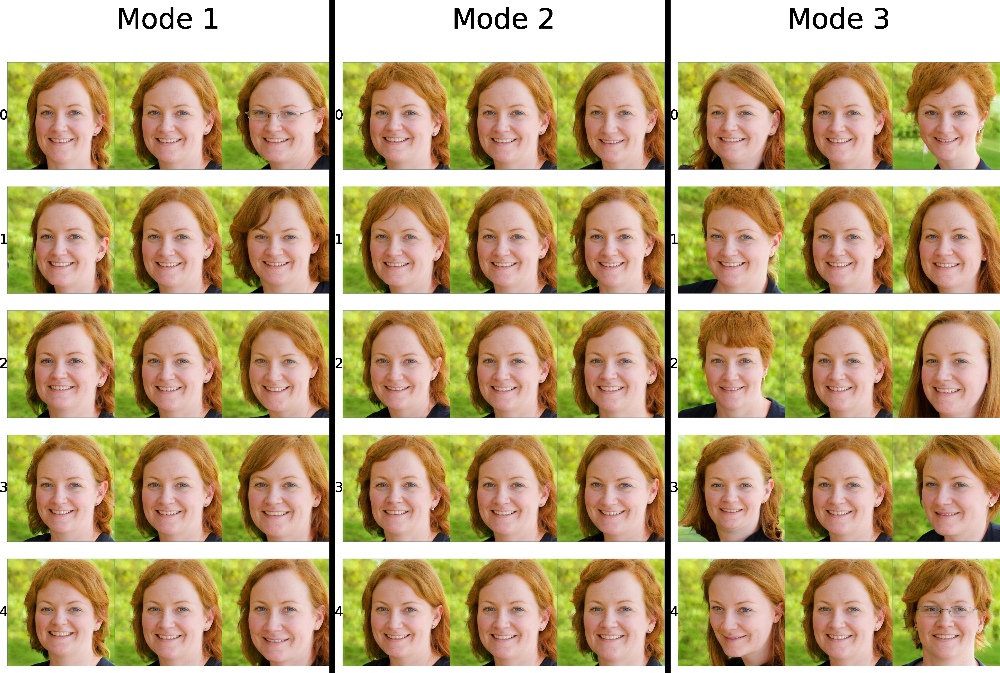

In [50]:
#sample_id = 1 # 0, 1 for Car512
#sample_id = 5 #for Cat256
# sample_id = 5 for Church256
# sample_id = 3,4,8 for Horse256
sample_id = 1
projected_code = codes[sample_id:sample_id+1]

# visualize
visualize_bases(generator,
                layers,
                gan_type,
                basis,
                dims,
                projected_code,
                magnitudes,
                step,
                semantics_per_col=5,
                skip_first=True)